In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import shutil
import json
import re
from tqdm.notebook import tqdm  # Using notebook version of tqdm
import logging

# === CONFIGURATION ===
BASE_DIR = '/content/drive/MyDrive/Gemini_Captions'
NUM_FOLDERS = 10
IMAGE_FOLDER_TMPL = 'kg_images{}'
CAPTION_FILE_TMPL = 'kg_captions{}.json'
OUTPUT_IMG_DIR    = 'kg_train'
OUTPUT_CAP_FILE   = 'kg_train.json'

# Create output directory if it does not exist
out_img_dir = os.path.join(BASE_DIR, OUTPUT_IMG_DIR)
os.makedirs(out_img_dir, exist_ok=True)

filename_re = re.compile(r'^file(\d+)\.jpg$', re.IGNORECASE)
all_captions = []

# === Logging Configuration ===
logging.basicConfig(level=logging.INFO, format='%(message)s')
logger = logging.getLogger()

# Function to log dynamically (display only new logs without overloading)
def log_dynamic(message, newline=False):
    if newline:
        logger.info(message)
    else:
        logger.info(f'\r{message}', end='', flush=True)

# Loop through folders with a progress bar
for idx in tqdm(range(1, NUM_FOLDERS + 1), desc="Processing folders", position=0, leave=True, dynamic_ncols=True):
    offset   = idx * 1000
    img_dir  = os.path.join(BASE_DIR, IMAGE_FOLDER_TMPL.format(idx))
    cap_file = os.path.join(BASE_DIR, CAPTION_FILE_TMPL.format(idx))

    with open(cap_file, 'r', encoding='utf-8') as f:
        captions = json.load(f)

    skipped_images = 0  # Track skipped files in each folder

    for entry in tqdm(captions, desc=f"Folder {idx}", position=1, leave=False, ncols=100, mininterval=0.3):
        orig = entry['filename']
        m = filename_re.match(orig)
        if not m:
            skipped_images += 1  # Increment skipped count
            continue  # Silently skip unexpected names

        new_idx  = offset + int(m.group(1))
        new_name = f'file{new_idx}.jpg'
        src = os.path.join(img_dir, orig)
        dst = os.path.join(out_img_dir, new_name)

        # Ensure the destination directory exists
        os.makedirs(os.path.dirname(dst), exist_ok=True)

        try:
            shutil.copy2(src, dst)
            entry['filename'] = new_name
            all_captions.append(entry)
        except FileNotFoundError:
            log_dynamic(f"⚠️ File not found: {src}", newline=False)
            skipped_images += 1

    # Log skipped images for the current folder
    log_dynamic(f"Folder {idx}: Skipped {skipped_images} images", newline=False)

# Write combined JSON
out_cap = os.path.join(BASE_DIR, OUTPUT_CAP_FILE)
with open(out_cap, 'w', encoding='utf-8') as f:
    json.dump(all_captions, f, indent=4, ensure_ascii=False)

# Final counts
num_images = len([f for f in os.listdir(out_img_dir) if f.lower().endswith('.jpg')])
num_captions = len(all_captions)

# Summary log (minimal)
log_dynamic(f"\n✅ Total images copied to '{OUTPUT_IMG_DIR}': {num_images}", newline=True)
log_dynamic(f"✅ Total caption entries in '{OUTPUT_CAP_FILE}': {num_captions}", newline=True)


Processing folders:   0%|          | 0/10 [00:00<?, ?it/s]

Folder 1:   0%|                                                            | 0/1000 [00:00<?, ?it/s]

Folder 2:   0%|                                                            | 0/1000 [00:00<?, ?it/s]

Folder 3:   0%|                                                            | 0/1000 [00:00<?, ?it/s]

Folder 4:   0%|                                                            | 0/1000 [00:00<?, ?it/s]

Folder 5:   0%|                                                            | 0/1000 [00:00<?, ?it/s]

Folder 6:   0%|                                                            | 0/1000 [00:00<?, ?it/s]

Folder 7:   0%|                                                            | 0/1000 [00:00<?, ?it/s]

Folder 8:   0%|                                                            | 0/1000 [00:00<?, ?it/s]

Folder 9:   0%|                                                            | 0/1000 [00:00<?, ?it/s]

Folder 10:   0%|                                                           | 0/1224 [00:00<?, ?it/s]

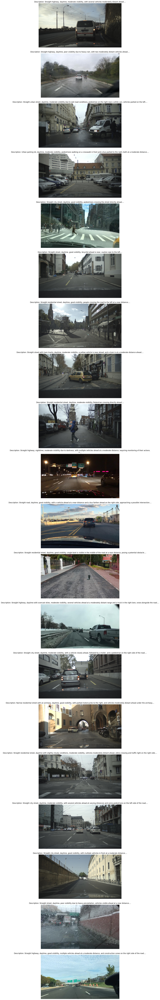


✅ Total images in output directory: 10224
✅ Total expected images: 10224
✅ Total descriptions: 10224


In [ ]:
import os
import json
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# === CONFIGURATION ===
BASE_DIR = '/content/drive/MyDrive/Gemini_Captions'
OUTPUT_IMG_DIR = 'kg_train'
OUTPUT_CAP_FILE = 'kg_train.json'

# Load captions from the combined JSON file
with open(os.path.join(BASE_DIR, OUTPUT_CAP_FILE), 'r', encoding='utf-8') as f:
    all_captions = json.load(f)

# List of all expected image filenames (file1.jpg to file10224.jpg)
expected_image_files = {f"file{i}.jpg" for i in range(1, 10225)}

# Check if images are present in the output directory
actual_image_files = {f.lower() for f in os.listdir(os.path.join(BASE_DIR, OUTPUT_IMG_DIR)) if f.lower().endswith('.jpg')}

# Get images that are present and matching with captions
matching_images = {entry['filename'].lower() for entry in all_captions if entry['filename'].lower() in actual_image_files}

# Convert the set of matching images to a list for random sampling
random_images = random.sample(list(matching_images), 20)

# Display images with their captions
plt.figure(figsize=(100, 100))
for idx, img_name in enumerate(random_images, 1):
    img_path = os.path.join(BASE_DIR, OUTPUT_IMG_DIR, img_name)

    # Look for the correct key for captions (using 'description' instead of 'caption')
    caption = next((entry.get('description', 'No description available') for entry in all_captions if entry['filename'].lower() == img_name), 'No description available')

    # Read and display image
    img = mpimg.imread(img_path)
    plt.subplot(20, 1, idx)  # Arrange images in a 5x4 grid
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Description: {caption[:]}...")  # Display first 50 chars of description

plt.tight_layout()
plt.show()

# Report summary
print(f"\n✅ Total images in output directory: {len(actual_image_files)}")
print(f"✅ Total expected images: {len(expected_image_files)}")
print(f"✅ Total descriptions: {len(all_captions)}")
